In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport

In [2]:
data_pure=pd.read_csv("energy_dataset.csv", sep=";")

In [3]:
#Quitando todas las columnas que estan en blanco
data_pure = data_pure.drop(["generation fossil coal-derived gas",
                  "generation fossil oil shale",
                  "generation fossil peat",
                  "generation geothermal",
                  "generation hydro pumped storage aggregated",
                  "generation marine",
                  "generation wind offshore",
                  "forecast wind offshore day ahead"],axis=1)

data_pure['time'] = pd.to_datetime(data_pure['time'],utc=True)

In [4]:
data_pure

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,...,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,...,73.0,49.0,196.0,6378.0,17,6436,26118,25385.0,50.10,65.41
1,2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,...,71.0,50.0,195.0,5890.0,16,5856,24934,24382.0,48.10,64.92
2,2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,...,73.0,50.0,196.0,5461.0,8,5454,23515,22734.0,47.33,64.48
3,2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,...,75.0,50.0,191.0,5238.0,2,5151,22642,21286.0,42.27,59.32
4,2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,...,74.0,42.0,189.0,4935.0,9,4861,21785,20264.0,38.41,56.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,2018-12-31 18:00:00+00:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,...,95.0,85.0,277.0,3113.0,96,3253,30619,30653.0,68.85,77.02
35060,2018-12-31 19:00:00+00:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,...,95.0,33.0,280.0,3288.0,51,3353,29932,29735.0,68.40,76.16
35061,2018-12-31 20:00:00+00:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,...,94.0,31.0,286.0,3503.0,36,3404,27903,28071.0,66.88,74.30
35062,2018-12-31 21:00:00+00:00,293.0,0.0,6562.0,2293.0,163.0,108.0,1128.0,2068.0,6075.0,...,93.0,31.0,287.0,3586.0,29,3273,25450,25801.0,63.93,69.89


In [5]:
data_weather=pd.read_csv("weather_features.csv", sep=",")
data_weather['dt_iso'] = pd.to_datetime(data_weather['dt_iso'],utc=True)

# Profile Weather

In [6]:
profile_weather = ProfileReport(data_weather, title="Pandas Profiling Report")

In [6]:
profile_weather.to_notebook_iframe()

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Creating a dataset per city

In [7]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [8]:
data_weather_Valencia = data_weather[data_weather["city_name"]=="Valencia"]
data_weather_Valencia = data_weather_Valencia.drop_duplicates(['dt_iso'], keep='last')
data_weather_Valencia = data_weather_Valencia.reset_index()
data_weather_Valencia = data_weather_Valencia.drop(["dt_iso",
                                                "city_name",
                                                "index"],axis=1)
data_weather_Valencia = data_weather_Valencia.rename(columns=lambda x: x+'_Valencia')

var_objects = data_weather_Valencia.dtypes==object
var_cols = data_weather_Valencia.columns[var_objects].tolist()

data_weather_Valencia[var_cols] = data_weather_Valencia[var_cols].apply(lambda col: le.fit_transform(col))

data_weather_Valencia

,temp_Valencia,temp_min_Valencia,temp_max_Valencia,pressure_Valencia,humidity_Valencia,wind_speed_Valencia,wind_deg_Valencia,rain_1h_Valencia,rain_3h_Valencia,snow_3h_Valencia,clouds_all_Valencia,weather_id_Valencia,weather_main_Valencia,weather_description_Valencia,weather_icon_Valencia
0,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,0,17,2
1,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,0,17,2
2,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,0,17,2
3,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,0,17,2
4,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,0,17,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,285.640,285.150,286.150,1028,62,2,140,0.0,0.0,0.0,0,800,0,17,2
35060,283.140,282.150,284.150,1029,71,1,242,0.0,0.0,0.0,0,800,0,17,2
35061,281.660,281.150,282.150,1029,81,3,300,0.0,0.0,0.0,0,800,0,17,2
35062,280.140,279.150,281.150,1029,81,2,310,0.0,0.0,0.0,0,800,0,17,2


In [9]:
data_weather_Barcelona = data_weather[data_weather["city_name"]==" Barcelona"]
data_weather_Barcelona = data_weather_Barcelona.drop_duplicates(['dt_iso'], keep='last')
data_weather_Barcelona = data_weather_Barcelona.reset_index()
data_weather_Barcelona = data_weather_Barcelona.drop(["dt_iso",
                                                "city_name",
                                                "index"],axis=1)

data_weather_Barcelona = data_weather_Barcelona.rename(columns=lambda x: x+'_Barcelona')

var_objects = data_weather_Barcelona.dtypes==object
var_cols = data_weather_Barcelona.columns[var_objects].tolist()

data_weather_Barcelona[var_cols] = data_weather_Barcelona[var_cols].apply(lambda col: le.fit_transform(col))

data_weather_Barcelona

,temp_Barcelona,temp_min_Barcelona,temp_max_Barcelona,pressure_Barcelona,humidity_Barcelona,wind_speed_Barcelona,wind_deg_Barcelona,rain_1h_Barcelona,rain_3h_Barcelona,snow_3h_Barcelona,clouds_all_Barcelona,weather_id_Barcelona,weather_main_Barcelona,weather_description_Barcelona,weather_icon_Barcelona
0,281.625,281.625,281.625,1035,100,7,58,0.0,0.0,0.0,0,800,0,25,2
1,281.625,281.625,281.625,1035,100,7,58,0.0,0.0,0.0,0,800,0,25,2
2,281.286,281.286,281.286,1036,100,7,48,0.0,0.0,0.0,0,800,0,25,2
3,281.286,281.286,281.286,1036,100,7,48,0.0,0.0,0.0,0,800,0,25,2
4,281.286,281.286,281.286,1036,100,7,48,0.0,0.0,0.0,0,800,0,25,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,284.130,282.150,286.150,1027,71,1,250,0.0,0.0,0.0,0,800,0,25,2
35060,282.640,281.150,284.150,1027,62,3,270,0.0,0.0,0.0,0,800,0,25,2
35061,282.140,280.150,284.150,1028,53,4,300,0.0,0.0,0.0,0,800,0,25,2
35062,281.130,278.150,284.150,1028,50,5,320,0.0,0.0,0.0,0,800,0,25,2


In [10]:
data_weather_Seville = data_weather[data_weather["city_name"]=="Seville"]
data_weather_Seville = data_weather_Seville.drop_duplicates(['dt_iso'], keep='last')
data_weather_Seville = data_weather_Seville.reset_index()
data_weather_Seville = data_weather_Seville.drop(["dt_iso",
                                                "city_name",
                                                "index"],axis=1)

data_weather_Seville = data_weather_Seville.rename(columns=lambda x: x+'_Seville')

var_objects = data_weather_Seville.dtypes==object
var_cols = data_weather_Seville.columns[var_objects].tolist()

data_weather_Seville[var_cols] = data_weather_Seville[var_cols].apply(lambda col: le.fit_transform(col))

data_weather_Seville

,temp_Seville,temp_min_Seville,temp_max_Seville,pressure_Seville,humidity_Seville,wind_speed_Seville,wind_deg_Seville,rain_1h_Seville,rain_3h_Seville,snow_3h_Seville,clouds_all_Seville,weather_id_Seville,weather_main_Seville,weather_description_Seville,weather_icon_Seville
0,273.375,273.375,273.375,1039,75,1,21,0.0,0.0,0.0,0,800,0,21,2
1,273.375,273.375,273.375,1039,75,1,21,0.0,0.0,0.0,0,800,0,21,2
2,274.086,274.086,274.086,1039,71,3,27,0.0,0.0,0.0,0,800,0,21,2
3,274.086,274.086,274.086,1039,71,3,27,0.0,0.0,0.0,0,800,0,21,2
4,274.086,274.086,274.086,1039,71,3,27,0.0,0.0,0.0,0,800,0,21,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,287.760,287.150,288.150,1028,54,3,30,0.0,0.0,0.0,0,800,0,21,2
35060,285.760,285.150,286.150,1029,62,3,30,0.0,0.0,0.0,0,800,0,21,2
35061,285.150,285.150,285.150,1028,58,4,50,0.0,0.0,0.0,0,800,0,21,2
35062,284.150,284.150,284.150,1029,57,4,60,0.0,0.0,0.0,0,800,0,21,2


In [11]:
data_weather_Bilbao = data_weather[data_weather["city_name"]=="Bilbao"]
data_weather_Bilbao = data_weather_Bilbao.drop_duplicates(['dt_iso'], keep='last')
data_weather_Bilbao = data_weather_Bilbao.reset_index()
data_weather_Bilbao = data_weather_Bilbao.drop(["dt_iso",
                                                "city_name",
                                                "index"],axis=1)

data_weather_Bilbao = data_weather_Bilbao.rename(columns=lambda x: x+'_Bilbao')

var_objects = data_weather_Bilbao.dtypes==object
var_cols = data_weather_Bilbao.columns[var_objects].tolist()

data_weather_Bilbao[var_cols] = data_weather_Bilbao[var_cols].apply(lambda col: le.fit_transform(col))

data_weather_Bilbao

,temp_Bilbao,temp_min_Bilbao,temp_max_Bilbao,pressure_Bilbao,humidity_Bilbao,wind_speed_Bilbao,wind_deg_Bilbao,rain_1h_Bilbao,rain_3h_Bilbao,snow_3h_Bilbao,clouds_all_Bilbao,weather_id_Bilbao,weather_main_Bilbao,weather_description_Bilbao,weather_icon_Bilbao
0,269.657312,269.657312,269.657312,1036,97,0,226,0.0,0.0,0.0,0,800,0,28,0
1,269.763500,269.763500,269.763500,1035,97,0,229,0.0,0.0,0.0,0,800,0,28,0
2,269.251688,269.251688,269.251688,1036,97,1,224,0.0,0.0,0.0,0,800,0,28,0
3,269.203344,269.203344,269.203344,1035,97,1,225,0.0,0.0,0.0,0,800,0,28,0
4,269.485500,269.485500,269.485500,1035,97,1,221,0.0,0.0,0.0,0,800,0,28,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,281.260000,280.150000,282.150000,1033,93,0,57,0.0,0.0,0.0,0,800,0,28,2
35060,279.810000,278.150000,281.150000,1034,93,1,0,0.0,0.0,0.0,0,800,0,28,2
35061,277.150000,277.150000,277.150000,1034,100,1,140,0.0,0.0,0.0,0,800,0,28,2
35062,276.600000,276.150000,277.150000,1034,93,1,120,0.0,0.0,0.0,0,800,0,28,2


In [12]:
data_weather_Madrid = data_weather[data_weather["city_name"]=="Madrid"]
data_weather_Madrid = data_weather_Madrid.drop_duplicates(['dt_iso'], keep='last')
data_weather_Madrid = data_weather_Madrid.reset_index()
data_weather_Madrid = data_weather_Madrid.drop(["dt_iso",
                                                "city_name",
                                                "index"],axis=1)

data_weather_Madrid = data_weather_Madrid.rename(columns=lambda x: x+'_Madrid')

var_objects = data_weather_Madrid.dtypes==object
var_cols = data_weather_Madrid.columns[var_objects].tolist()

data_weather_Madrid[var_cols] = data_weather_Madrid[var_cols].apply(lambda col: le.fit_transform(col))

data_weather_Madrid

,temp_Madrid,temp_min_Madrid,temp_max_Madrid,pressure_Madrid,humidity_Madrid,wind_speed_Madrid,wind_deg_Madrid,rain_1h_Madrid,rain_3h_Madrid,snow_3h_Madrid,clouds_all_Madrid,weather_id_Madrid,weather_main_Madrid,weather_description_Madrid,weather_icon_Madrid
0,267.325,267.325,267.325,971,63,1,309,0.0,0.0,0.0,0,800,0,24,2
1,267.325,267.325,267.325,971,63,1,309,0.0,0.0,0.0,0,800,0,24,2
2,266.186,266.186,266.186,971,64,1,273,0.0,0.0,0.0,0,800,0,24,2
3,266.186,266.186,266.186,971,64,1,273,0.0,0.0,0.0,0,800,0,24,2
4,266.186,266.186,266.186,971,64,1,273,0.0,0.0,0.0,0,800,0,24,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,283.560,282.150,285.150,1030,88,1,280,0.0,0.0,0.0,0,800,0,24,2
35060,280.120,278.150,281.150,1031,52,1,260,0.0,0.0,0.0,0,800,0,24,2
35061,278.150,278.150,278.150,1030,65,1,340,0.0,0.0,0.0,0,800,0,24,2
35062,276.570,276.150,277.150,1031,69,2,340,0.0,0.0,0.0,0,800,0,24,2


# Dataset joint weather per city and Energy

In [13]:
data = pd.concat([data_pure["time"], data_weather_Valencia, data_weather_Barcelona
                  ,data_weather_Seville, data_weather_Bilbao, data_weather_Madrid, data_pure],
                axis = 1)

data = data.dropna()

In [14]:
data = data.loc[:,~data.columns.duplicated()]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35018 entries, 0 to 35063
Data columns (total 96 columns):
 #   Column                                       Non-Null Count  Dtype              
---  ------                                       --------------  -----              
 0   time                                         35018 non-null  datetime64[ns, UTC]
 1   temp_Valencia                                35018 non-null  float64            
 2   temp_min_Valencia                            35018 non-null  float64            
 3   temp_max_Valencia                            35018 non-null  float64            
 4   pressure_Valencia                            35018 non-null  int64              
 5   humidity_Valencia                            35018 non-null  int64              
 6   wind_speed_Valencia                          35018 non-null  int64              
 7   wind_deg_Valencia                            35018 non-null  int64              
 8   rain_1h_Valencia          

In [26]:
data.to_csv("data_by_city")

# Profile Report of the whole dataset

In [211]:
profile = ProfileReport(data.iloc[::10], title="Pandas Profiling Report")

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/110 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("energy_and_weather_profile.html")

# Estimating with Exponential Smoothing

In [83]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt


In [84]:
#creating a dataset of the first hour of each month
data_last_hour_monthly=data
data_last_hour_monthly.set_index('time')
dates_month = pd.bdate_range(data_last_hour_monthly['time'].min(), data_last_hour_monthly['time'].max(), freq='1M')
data_end_of_month = data_last_hour_monthly[data_last_hour_monthly['time'].isin(dates_month)]
data_end_of_month.head()

,time,temp_Valencia,temp_min_Valencia,temp_max_Valencia,pressure_Valencia,humidity_Valencia,wind_speed_Valencia,wind_deg_Valencia,rain_1h_Valencia,rain_3h_Valencia,...,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
721,2015-01-31 00:00:00+00:00,288.8500,288.8500,288.8500,991,75,20,300,0.0000,0.0000,...,64.0000,121.0000,200.0000,12413.0000,3,12661,26547,26851.0000,4.0000,24.9100
1393,2015-02-28 00:00:00+00:00,282.1660,282.1660,282.1660,993,43,4,333,0.0000,0.0000,...,75.0000,67.0000,195.0000,7287.0000,65,7363,25993,25645.0000,30.1000,40.8100
2137,2015-03-31 00:00:00+00:00,286.8265,286.8265,286.8265,1023,56,1,143,0.0000,0.0000,...,66.0000,599.0000,135.0000,6789.0000,502,7013,22699,22552.0000,28.4800,39.8800
2857,2015-04-30 00:00:00+00:00,284.2870,284.2870,284.2870,991,97,1,26,0.0000,0.0000,...,72.0000,644.0000,198.0000,3628.0000,548,3628,22247,22595.0000,55.1000,64.8800
3601,2015-05-31 00:00:00+00:00,285.1870,285.1870,285.1870,989,97,1,53,0.0000,0.0000,...,67.0000,605.0000,206.0000,2837.0000,535,2933,21401,21121.0000,47.0000,57.6400


In [85]:
energy_production = data_end_of_month['total load actual']
energy_price = data_end_of_month['price actual']

In [86]:
def simple_exp_smooth(d,extra_periods=1,alpha=0.4):  
  d = np.array(d)  # Transform the input into a numpy array  
  cols = len(d)  # Historical period length  
  d = np.append(d,[np.nan]*extra_periods)  # Append np.nan into the demand array to cover future periods  
  f = np.full(cols+extra_periods,np.nan)  # Forecast array  
  f[1] = d[0]  # initialization of first forecast  
  # Create all the t+1 forecasts until end of historical period  
  for t in range(2,cols+1):  
    f[t] = alpha*d[t-1]+(1-alpha)*f[t-1]  
  f[cols+1:] = f[t]  # Forecast for all extra periods  
  df = pd.DataFrame.from_dict({"Demand":d,"Forecast":f,"Error":d-f})
  return df

In [19]:
df = simple_exp_smooth(energy_production, extra_periods=7)

<AxesSubplot:title={'center':'Simple Smoothing for Prediction of Energy Demand Monthly'}>

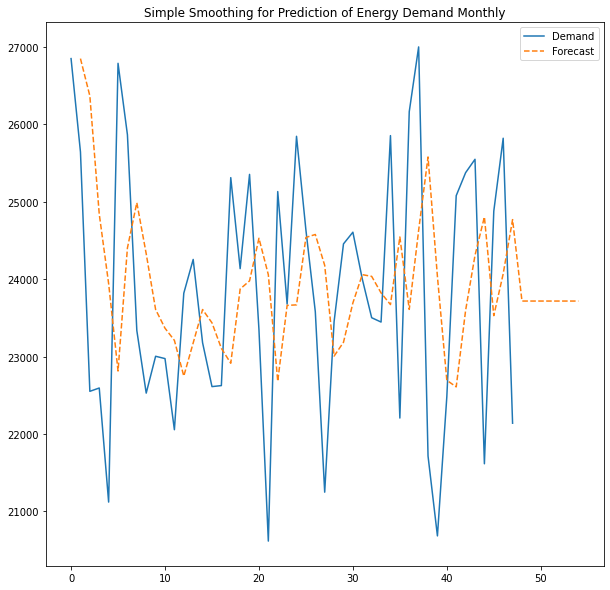

In [20]:
df[["Demand","Forecast"]].plot(figsize=(10,10),title="Simple Smoothing for Prediction of Energy Demand Monthly",style=["-","--"])

In [21]:
#
MAE = df["Error"].abs().mean()   
RMSE = np.sqrt((df["Error"]**2).mean())

In [22]:
MAE

1643.1150859496959

In [23]:
RMSE

1978.342467163973

In [87]:
index = pd.date_range(start=data_last_hour_monthly['time'].min(), end= data_last_hour_monthly['time'].max(), freq='m')
energy_production_series = pd.Series(energy_production.to_numpy(), index)

In [88]:
fit3 = SimpleExpSmoothing(energy_production_series, initialization_method="estimated").fit()
fcast3 = fit3.forecast(3).rename(r'$\alpha=%s$'%fit3.model.params['smoothing_level'])

Text(0.5, 1.0, 'Exponential Smoothing for Prediction of Energy Demand Monthly')

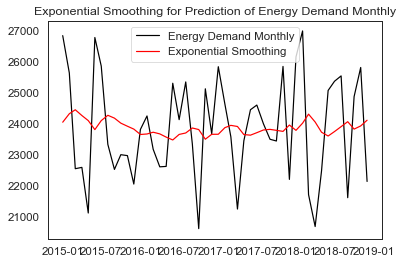

In [89]:
plt.plot(energy_production_series, color='black')
plt.plot(fit3.fittedvalues, color='red')
plt.legend(["Energy Demand Monthly","Exponential Smoothing"])
plt.title("Exponential Smoothing for Prediction of Energy Demand Monthly")

Text(0.5, 1.0, 'Holts Method for Prediction of Energy Demand Monthly')

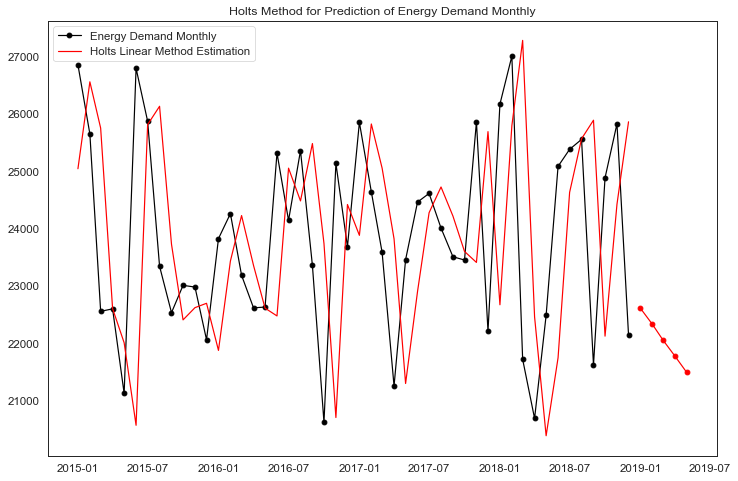

In [90]:
fit1 = Holt(energy_production_series, initialization_method="estimated").fit(smoothing_level=0.8, smoothing_trend=0.2, optimized=False)
fcast1 = fit1.forecast(5).rename("Holt's linear trend")

plt.figure(figsize=(12, 8))
plt.plot(energy_production_series, marker='o', color='black')
plt.plot(fit1.fittedvalues, color='red')
line1, = plt.plot(fcast1, marker='o', color='red')
plt.legend(["Energy Demand Monthly","Holts Linear Method Estimation"])
plt.title("Holts Method for Prediction of Energy Demand Monthly")

In [93]:
print('Test Mean Absolute Error:', mean_absolute_error(fit1.fittedvalues, energy_production) )
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(fit1.fittedvalues, energy_production)))

Test Mean Absolute Error: 1821.544572678221
Test Root Mean Squared Error: 2327.79315398036


# Demand Prediction

In [74]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import matplotlib.pyplot as plt
import pandas as pd
pd.set_option('display.float_format', lambda x: '%.4f' % x)
import seaborn as sns
sns.set_context("paper", font_scale=1.3)
sns.set_style('white')
import warnings
warnings.filterwarnings('ignore')
from time import time
import matplotlib.ticker as tkr
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from sklearn import preprocessing
from statsmodels.tsa.stattools import pacf
%matplotlib inline
import math
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import *
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from keras.callbacks import EarlyStopping

In [75]:
temp = data.copy() # make temporary copy of dataframe
dataset = temp['total load actual'].values # numpy.ndarray of the actual load
dataset = dataset.astype('float32') 
dataset = np.reshape(dataset, (-1, 1)) # reshape to one feature; required for the models

scaler = MinMaxScaler(feature_range=(0, 1)) # Min Max scaler
dataset = scaler.fit_transform(dataset) # fit and transform the dataset

# Train and Test splits
train_size = int(len(dataset) * 0.80) 
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)
    
look_back = 25 # timesteps to lookback for predictions
X_train, trainY = create_dataset(train, look_back)
X_test, testY = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
print("Shapes: \nTraining set: {}, Testing set: {}".format(X_train.shape, X_test.shape))
print("Sample from training set: \n{}".format(X_train[0]))

Shapes: 
Training set: (27988, 1, 25), Testing set: (6978, 1, 25)
Sample from training set: 
[[0.31966567 0.27600765 0.20427442 0.14124662 0.09676152 0.08113521
  0.08570558 0.10168016 0.08936191 0.11299729 0.1832071  0.23966217
  0.26516938 0.2904153  0.2886306  0.23883522 0.22098899 0.2422303
  0.36589193 0.43436062 0.47762692 0.5018717  0.47836685 0.38117003
  0.39300954]]


In [76]:
from statsmodels.tsa.ar_model import AR

model = AR(train)
model_fit = model.fit()

In [80]:
test_predict = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
# invert predictions
test_predict = scaler.inverse_transform(test_predict.reshape(-1, 1))
Y_test = scaler.inverse_transform(test)
print('Test Mean Absolute Error:', mean_absolute_error(Y_test, test_predict))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_test, test_predict)))

Test Mean Absolute Error: 3733.9399620042273
Test Root Mean Squared Error: 4396.428850973215


In [72]:
mape = np.mean(np.abs((Y_test - test_predict) / Y_test)) * 100
print("Testing MAPE: {}".format(mape))

Testing MAPE: 13.351648517399495


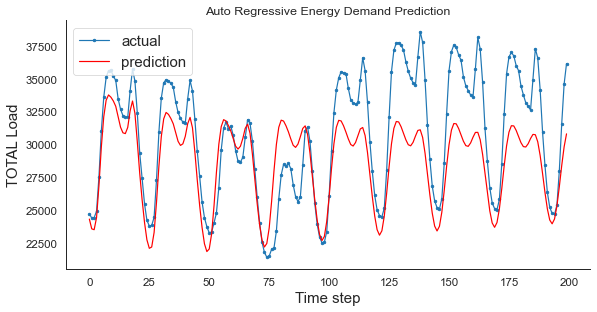

In [73]:
idx = 200
aa=[x for x in range(idx)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_test[:idx], marker='.', label="actual")
plt.plot(aa, test_predict[:idx], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.subplots_adjust(left=0.07)
plt.ylabel('TOTAL Load', size=15)
plt.xlabel('Time step', size=15)
plt.legend(fontsize=15)
plt.title("Auto Regressive Energy Demand Prediction")
plt.show();

In [53]:
test_predict = np.mean(X_test, axis=2)
print('Test Mean Absolute Error:', mean_absolute_error(testY, test_predict))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(testY, test_predict)))

Test Mean Absolute Error: 0.14494237
Test Root Mean Squared Error: 0.17461063


In [54]:
mape = np.mean(np.abs((Y_test - test_predict) / Y_test)) * 100
print("Testing MAPE: {}".format(mape))

ValueError: operands could not be broadcast together with shapes (7004,1) (6978,1) 

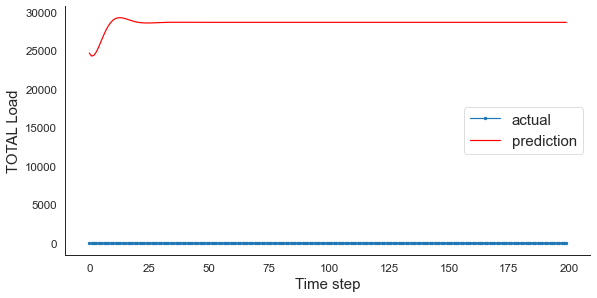

In [59]:
idx = 200
aa=[x for x in range(idx)]
plt.figure(figsize=(8,4))
plt.plot(aa, testY[:idx], marker='.', label="actual")
plt.plot(aa, test_predict[:idx], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.subplots_adjust(left=0.07)
plt.ylabel('TOTAL Load', size=15)
plt.xlabel('Time step', size=15)
plt.legend(fontsize=15)
plt.show();

In [55]:
from statsmodels.tsa.arima_model import ARMA

model = ARMA(train, order=(2, 1))
model_fit = model.fit(disp=False)

In [56]:
test_predict = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
# invert predictions
test_predict = scaler.inverse_transform(test_predict.reshape(-1, 1))
Y_test = scaler.inverse_transform(test)
print('Test Mean Absolute Error:', mean_absolute_error(Y_test, test_predict))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_test, test_predict)))

Test Mean Absolute Error: 3863.8296396708574
Test Root Mean Squared Error: 4522.5414021183315


In [57]:
mape = np.mean(np.abs((Y_test - test_predict) / Y_test)) * 100
print("Testing MAPE: {}".format(mape))

Testing MAPE: 13.817963711894881


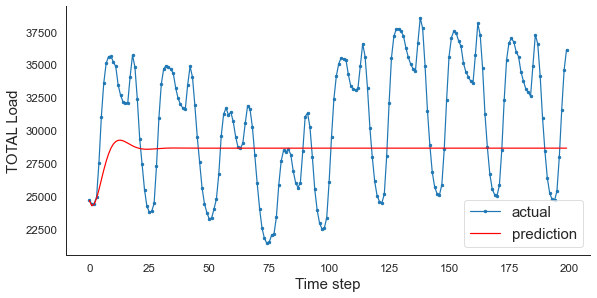

In [58]:
idx = 200
aa=[x for x in range(idx)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_test[:idx], marker='.', label="actual")
plt.plot(aa, test_predict[:idx], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.subplots_adjust(left=0.07)
plt.ylabel('TOTAL Load', size=15)
plt.xlabel('Time step', size=15)
plt.legend(fontsize=15)
plt.show();